<a href="https://colab.research.google.com/github/elinsyn/Fluid_mechanics/blob/main/Navier_Stokes_manhattan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Navier-Stokes equations**
**Johan Hoffman**

# **Abstract**

This short report show an example on how to use FEniCS to solve the Navier-Stokes equations, which is used in the course DD2365 Advanced Computation in Fluid Mechanics, at the KTH Royal Institute of Technology.

[DD2365 course website.](https://www.kth.se/social/course/DD2365/)

# **About the code**

In [ ]:
# This program is an example file for the course
# DD2365 Advanced Computation in Fluid Mechanics,
# KTH Royal Institute of Technology, Stockholm, Sweden.

# Copyright (C) 2020 Johan Hoffman (jhoffman@kth.se)

# This file is part of the course DD2365 Advanced Computation in Fluid Mechanics
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

# This template is maintained by Johan Hoffman
# Please report problems to jhoffman@kth.se

# **Set up environment**

In [2]:
# Load neccessary modules.
from google.colab import files

import numpy as np
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install-release-real.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin

from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions, and is also exported as pvd-files which can be visualized in Paraview.

We seek a finite element approximation $(u,p)\in V\times Q$ such that

$(\dot u + (u\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term.

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula:

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization,

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder).

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

To read more about how to use similar methods for more complex problems, see e.g.

[Hoffman, Johan, et al. "Towards a parameter-free method for high reynolds number turbulent flow simulation based on adaptive finite element approximation." Computer Methods in Applied Mechanics and Engineering 288 (2015): 60-74.](https://www.sciencedirect.com/science/article/pii/S0045782514004836)


# **Method**

**Define domain and mesh**

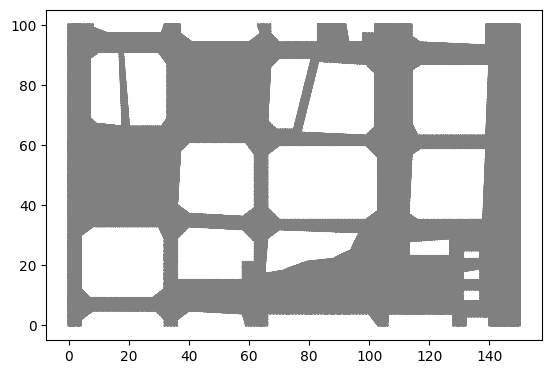

In [ ]:
# Define rectangular domain
L = 150
H = 100

# Define circle
xc = 1.0
yc = 0.5*H
rc = 0.2

# Define subdomains (for boundary conditions)
class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0.0)

class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L)

class Lower(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0.0)

class Upper(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], H)

left = Left()
right = Right()
lower = Lower()
upper = Upper()

# Barcelona casas
house1 = Polygon([Point(59, 100), Point(21, 100), Point(21, 91), Point(59, 91)])
house2 = Polygon([Point(59, 88), Point(21, 88), Point(21, 74), Point(59, 74)])
house3 = Polygon([Point(59, 72), Point(21, 72), Point(21, 58), Point(59, 58)])
house4 = Polygon([Point(59, 55), Point(21, 55), Point(21, 41), Point(59, 41)])
house5 = Polygon([Point(59, 38), Point(21, 38), Point(21, 24), Point(59, 24)])
house6 = Polygon([Point(59, 21), Point(21, 21), Point(21, 7), Point(59, 7)])
house7 = Polygon([Point(59, 4), Point(21, 4), Point(21, 0), Point(59, 0)])

house8 = Polygon([Point(116, 100), Point(63, 100), Point(63, 91), Point(116, 91)])
house9 = Polygon([Point(116, 88), Point(63, 88), Point(63, 74), Point(116, 74)])
house10 = Polygon([Point(116, 72), Point(63, 72), Point(63, 58), Point(116, 58)])
house11 = Polygon([Point(116, 55), Point(63, 55), Point(63, 41), Point(116, 41)])
house12 = Polygon([Point(116, 38), Point(63, 38), Point(63, 24), Point(116, 24)])
house13 = Polygon([Point(116, 21), Point(63, 21), Point(63, 7), Point(116, 7)])
house14 = Polygon([Point(116, 4), Point(63, 4), Point(63, 0), Point(116, 0)])

house15 = Polygon([Point(175, 100), Point(121, 100), Point(121, 91), Point(174, 91)])
house16 = Polygon([Point(175, 88), Point(121, 88), Point(121, 74), Point(174, 74)])
house17 = Polygon([Point(175, 72), Point(121, 72), Point(121, 58), Point(174, 58)])
house18 = Polygon([Point(175, 55), Point(121, 55), Point(121, 41), Point(174, 41)])
house19 = Polygon([Point(175, 38), Point(121, 38), Point(121, 24), Point(174, 24)])
house20 = Polygon([Point(175, 21), Point(121, 21), Point(121, 7), Point(174, 7)])
house21 = Polygon([Point(175, 4), Point(121, 4), Point(121, 0), Point(174, 0)])

house = house1 + house2 + house3 + house4 + house5 + house6 + house7 + house8 + house9 + house10 + house11 + house12 + house13 + house14 + house15 + house16 + house17 + house18 + house19 + house20 + house21
domain = Rectangle(Point(0.0, 0.0), Point(L, H)) - house
resolution = 150
mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - casa, resolution)


# Define mesh functions (for boundary conditions)
boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
boundaries.set_all(0)
left.mark(boundaries, 1)
right.mark(boundaries, 2)
lower.mark(boundaries, 3)
upper.mark(boundaries, 4)

plt.figure()
plot(mesh)
plt.show()

**Define finite element approximation spaces**

In [ ]:
# Generate finite element spaces (for velocity and pressure)
V = VectorFunctionSpace(mesh, "Lagrange", 1)
Q = FunctionSpace(mesh, "Lagrange", 1)

# Define trial and test functions
u = TrialFunction(V)
p = TrialFunction(Q)
v = TestFunction(V)
q = TestFunction(Q)

# Pollution concentration space
C = FunctionSpace(mesh, "Lagrange", 1)

c = TrialFunction(C)
w = TestFunction(C)

c0 = Function(C)   # concentration at previous time step
c1 = Function(C)   # concentration at current time step

**Define boundary conditions**

In [ ]:
# Define boundary conditions
class DirichletBoundaryLower(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], 0.0)

class DirichletBoundaryUpper(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[1], H)

class DirichletBoundaryLeft(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], 0.0)

class DirichletBoundaryRight(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and near(x[0], L)

class DirichletBoundaryObjects(SubDomain):
    def inside(self, x, on_boundary):
        return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

dbc_lower = DirichletBoundaryLower()
dbc_upper = DirichletBoundaryUpper()
dbc_left = DirichletBoundaryLeft()
dbc_right = DirichletBoundaryRight()
dbc_objects = DirichletBoundaryObjects()

# Examples of time dependent and stationary inflow conditions
#uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
#uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
uin = -1.0
bcu_in0 = DirichletBC(V.sub(0), uin, dbc_right)
bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_right)
bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
pout = 0.0
bcp0 = DirichletBC(Q, pin, dbc_left)
#bcp1 = DirichletBC(Q, pout, dbc_right)

bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
#bcu = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
bcp = [bcp0]

# Pullutant boundary
bc_c_in = DirichletBC(C, Constant(0.0), dbc_right)
bc_c = [bc_c_in]

# Define measure for boundary integration
ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

# **Results**

**Define flow parameters**

In [ ]:
# Set viscosity
#nu = 5.4015e-7
nu = 3.2385e-7

# Pollutant diffusion coefficient
Dpoll = Constant(0.5)

# Optional decay/removal rate, e.g. chemical decay or deposition
decay = Constant(0.0)

# Source of pollution
source_strength = 10.0
source_sigma = 2.0

S = Expression(
    "A*exp(-((x[0]-x1)*(x[0]-x1) + (x[1]-y1)*(x[1]-y1))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x2)*(x[0]-x2) + (x[1]-y2)*(x[1]-y2))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x3)*(x[0]-x3) + (x[1]-y3)*(x[1]-y3))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x4)*(x[0]-x4) + (x[1]-y4)*(x[1]-y4))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x5)*(x[0]-x5) + (x[1]-y5)*(x[1]-y5))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x6)*(x[0]-x6) + (x[1]-y6)*(x[1]-y6))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x7)*(x[0]-x7) + (x[1]-y7)*(x[1]-y7))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x8)*(x[0]-x8) + (x[1]-y8)*(x[1]-y8))/(2*sigma*sigma))"
    " + A*exp(-((x[0]-x9)*(x[0]-x9) + (x[1]-y9)*(x[1]-y9))/(2*sigma*sigma))",
    degree=2,
    A=10.0,
    x1=145.0, y1=10.0,
    x2=145.0,  y2=20.0,
    x3=145.0, y3=30.0,
    x4=145.0,  y4=40.0,
    x5=145.0,  y5=50.0,
    x6=145.0,  y6=60.0,
    x7=145.0,  y7=70.0,
    x8=145.0,  y8=80.0,
    x9=145.0,  y9=90.0,
    sigma=2.0
)

**Define method parameters**

In [ ]:
# Define iteration functions
# (u0,p0) solution from previous time step
# (u1,p1) linearized solution at present time step
u0 = Function(V)
u1 = Function(V)
p0 = Function(Q)
p1 = Function(Q)

# Set parameters for nonlinear and lienar solvers
num_nnlin_iter = 5
prec = "amg" if has_krylov_solver_preconditioner("amg") else "default"

# Time step length
dt = 0.5*mesh.hmin()

**Define variational problem**

In [ ]:
# Define variational problem

# Stabilization parameters
h = CellDiameter(mesh);
u_mag = sqrt(dot(u1,u1))
d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
d2 = h*u_mag

# Mean velocities for trapozoidal time stepping
um = 0.5*(u + u0)
um1 = 0.5*(u1 + u0)

# Momentum variational equation on residual form
Fu = inner((u - u0)/dt + grad(um)*um1, v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
    + d1*inner((u - u0)/dt + grad(um)*um1 + grad(p1), grad(v)*um1)*dx + d2*div(um)*div(v)*dx
au = lhs(Fu)
Lu = rhs(Fu)

# Continuity variational equation on residual form
Fp = d1*inner((u1 - u0)/dt + grad(um1)*um1 + grad(p), grad(q))*dx + div(um1)*q*dx
ap = lhs(Fp)
Lp = rhs(Fp)

# Mean concentration for trapezoidal / Crank-Nicolson time stepping
cm = 0.5*(c + c0)

# Pollution advection-diffusion-reaction equation
Fc = (
    ((c - c0)/dt)*w*dx
    + dot(u1, grad(cm))*w*dx
    + Dpoll*dot(grad(cm), grad(w))*dx
    + decay*cm*w*dx
    - S*w*dx
)

ac = lhs(Fc)
Lc = rhs(Fc)



**Triple decomposition**

**Compute force on boundary**

**Set plotting variables and open export files**

In [ ]:
# Open files to export solution to Paraview
file_u = File("results-NS/u.pvd")
file_p = File("results-NS/p.pvd")
file_c = File("results-NS/c.pvd")

# Set plot frequency
plot_time = 0
plot_freq = 30

# Force computation data
force_array = np.array(0.0)
force_array = np.delete(force_array, 0)
time = np.array(0.0)
time = np.delete(time, 0)
start_sample_time = 1.0

**Time stepping algorithm**

rm: cannot remove 'results-NS/png_frames': Is a directory
Time t = 0.2726279155437246


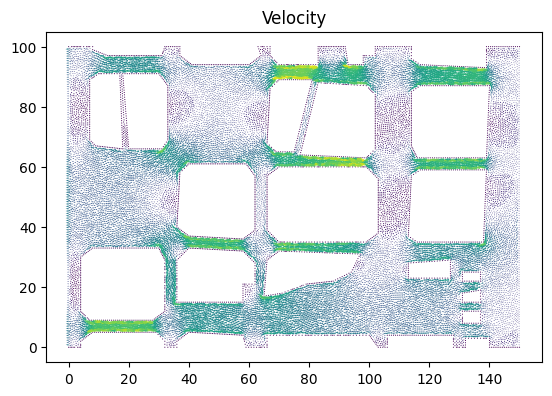

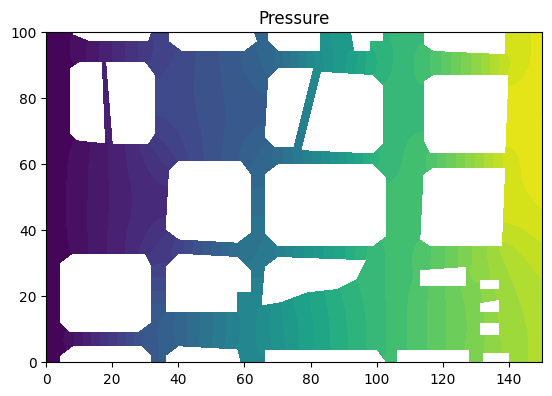

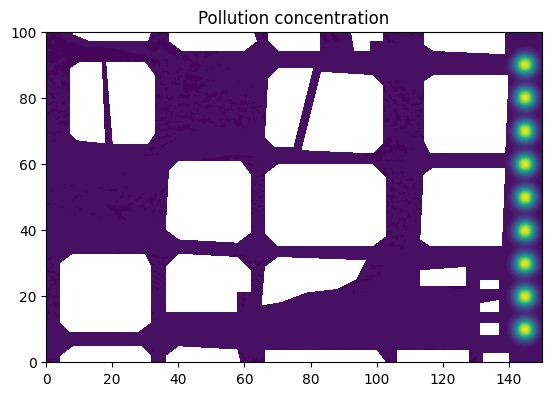

Time t = 1.9083954088060722


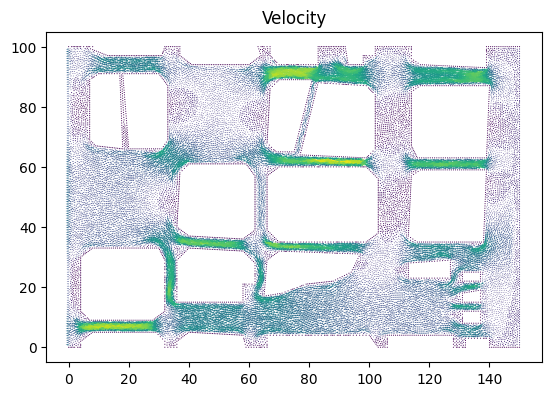

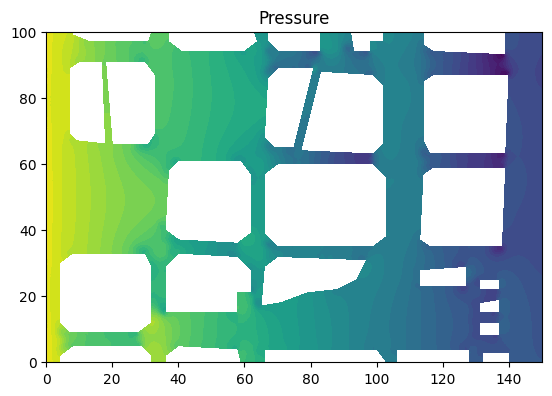

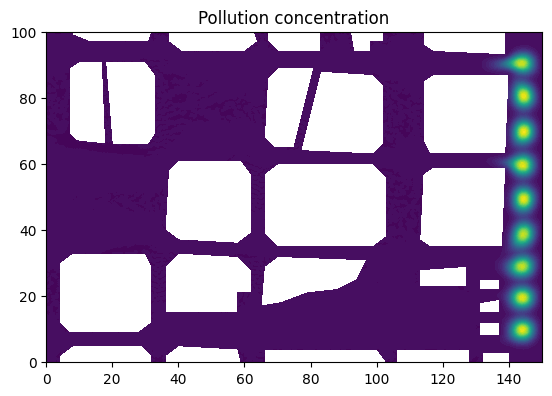

Time t = 3.544162902068421


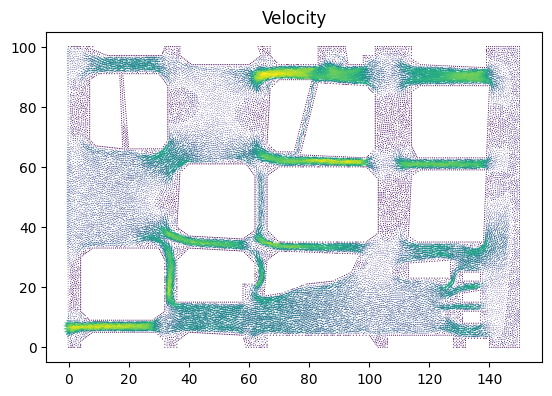

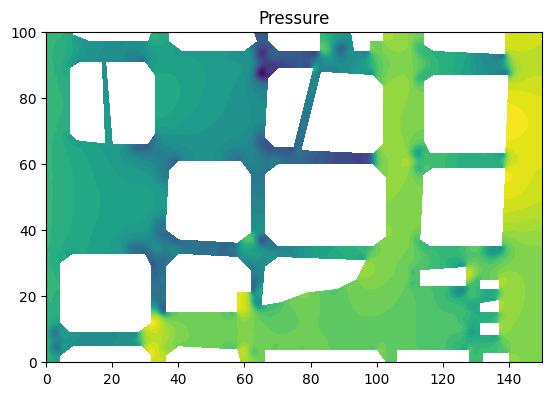

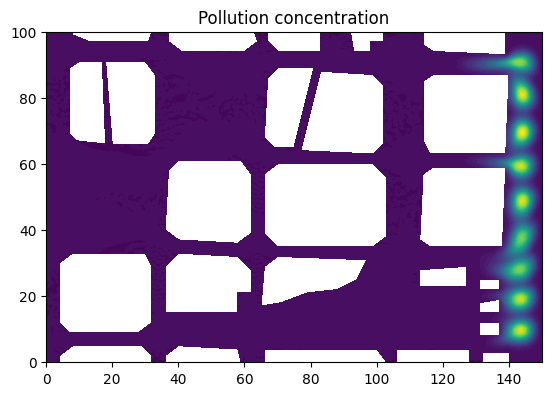

Time t = 5.179930395330768


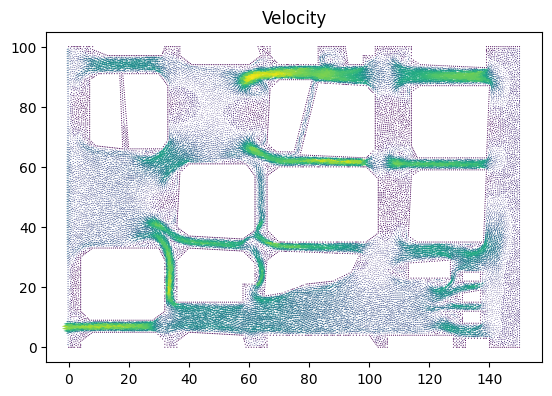

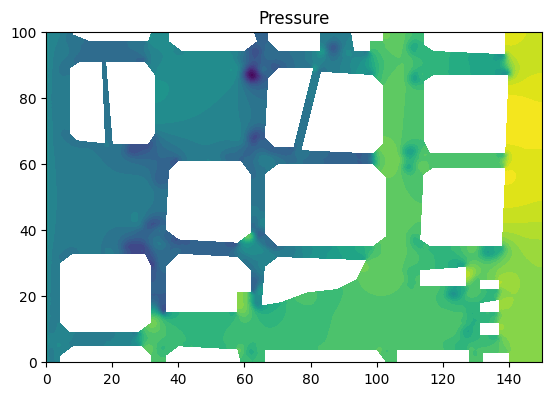

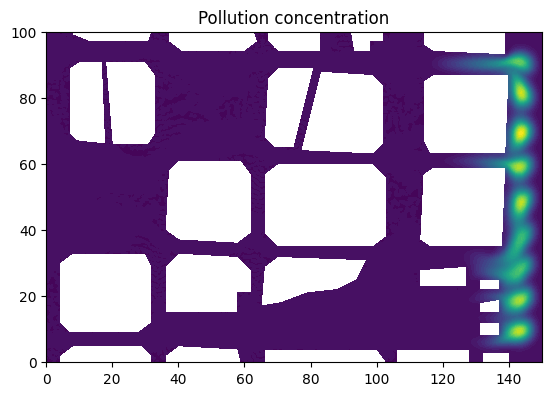

Time t = 6.815697888593114


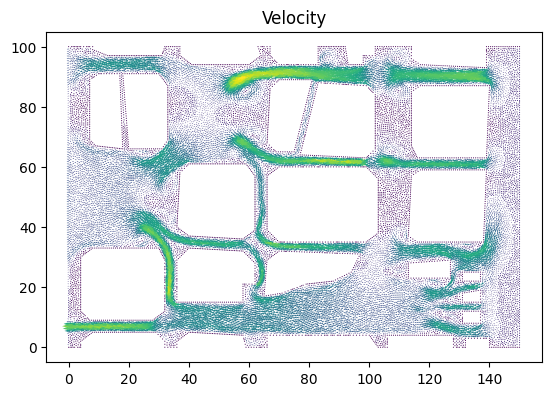

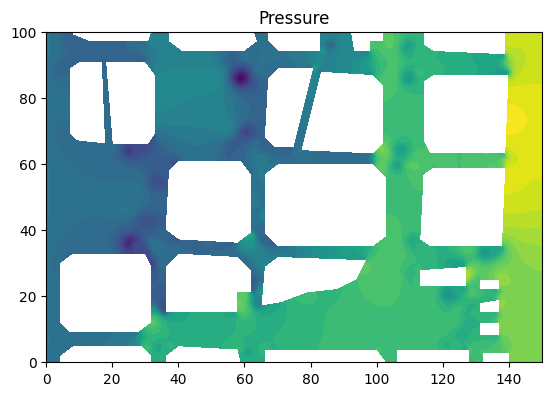

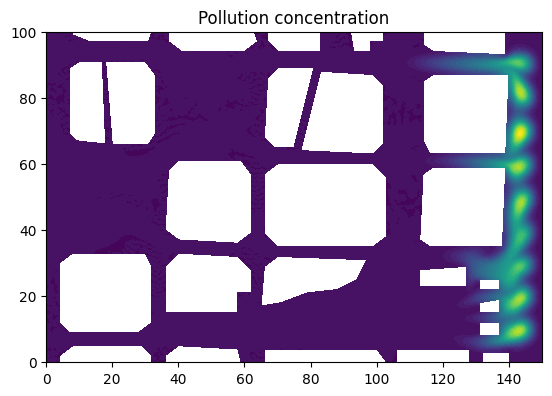

Time t = 8.45146538185546


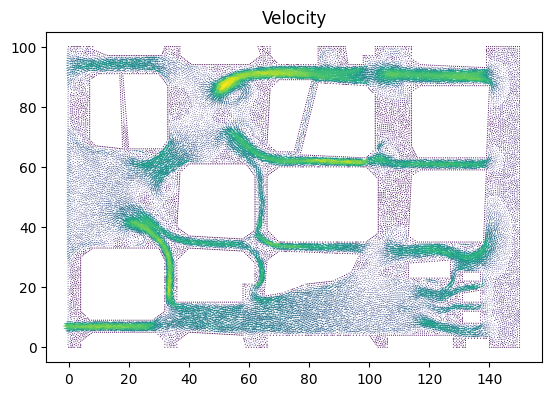

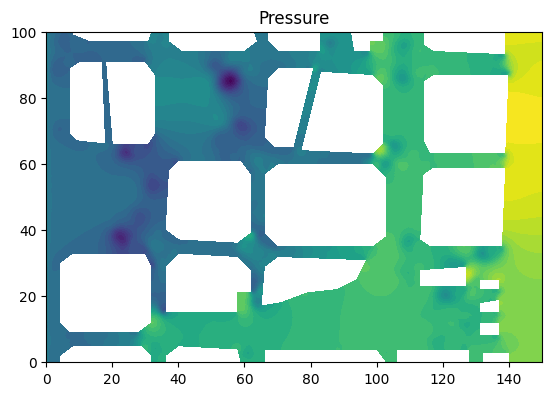

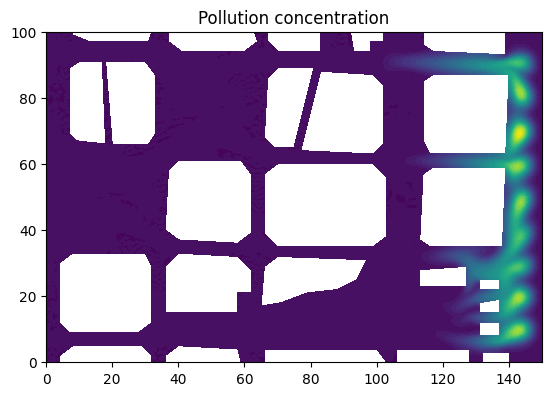

Time t = 10.087232875117806


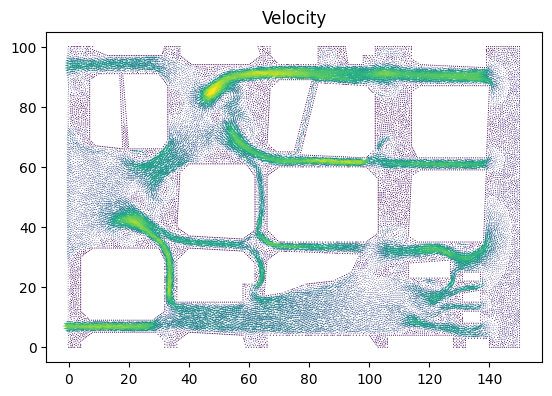

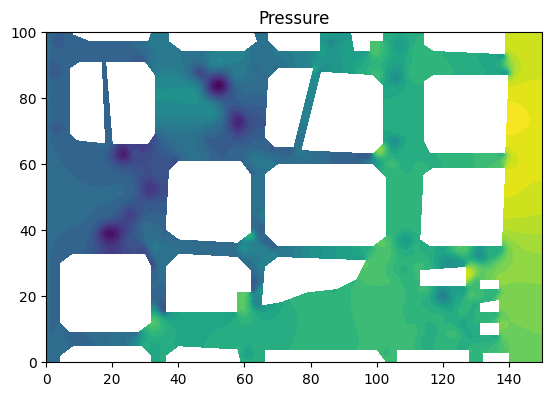

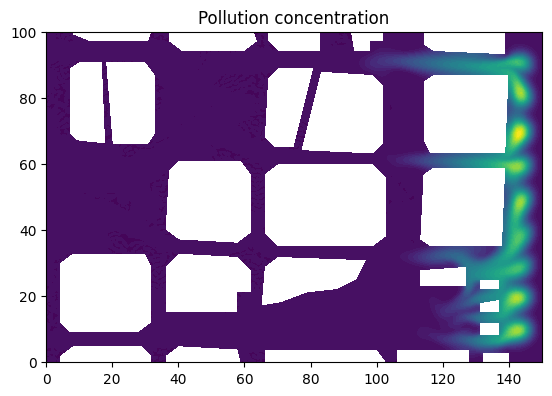

Time t = 11.723000368380152


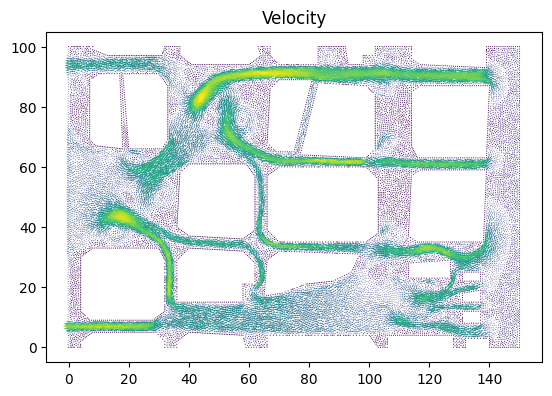

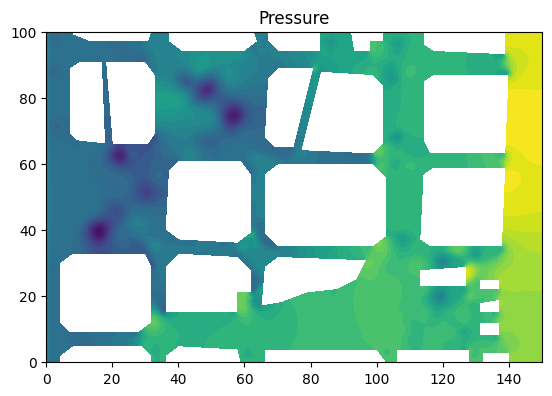

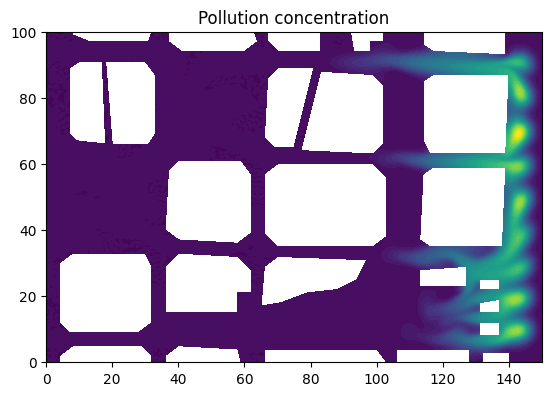

Time t = 13.358767861642498


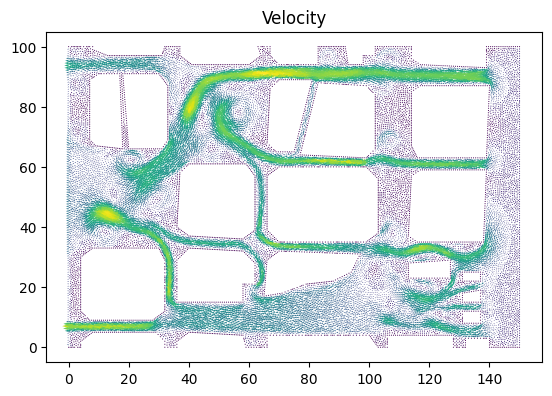

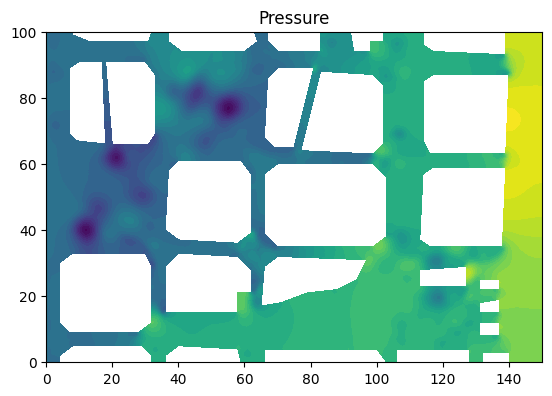

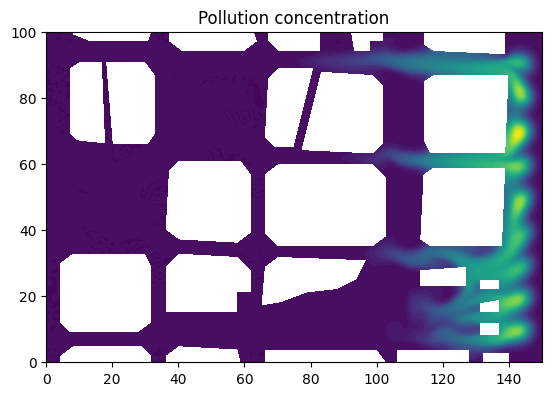

Time t = 15.267163270448568


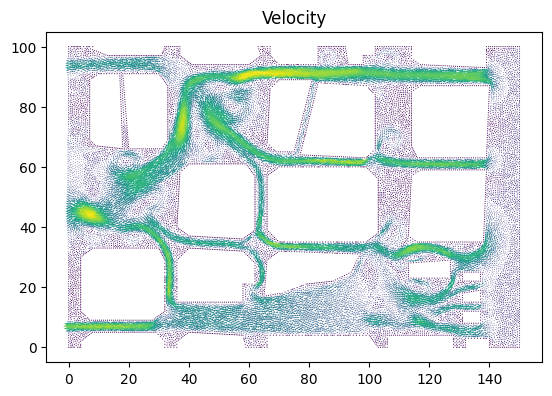

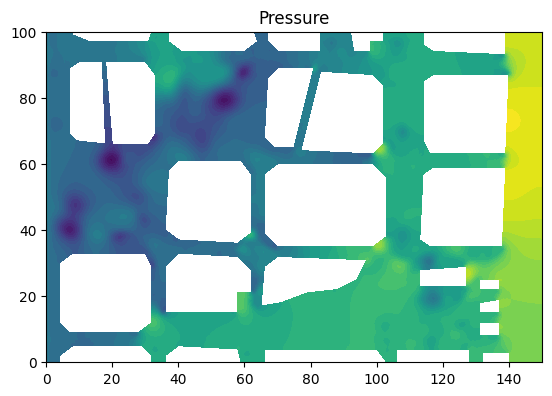

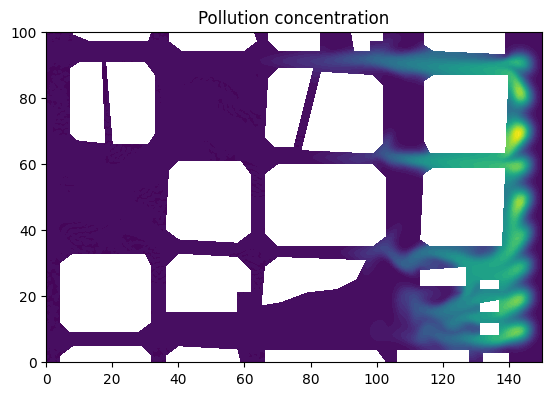

Time t = 16.90293076371092


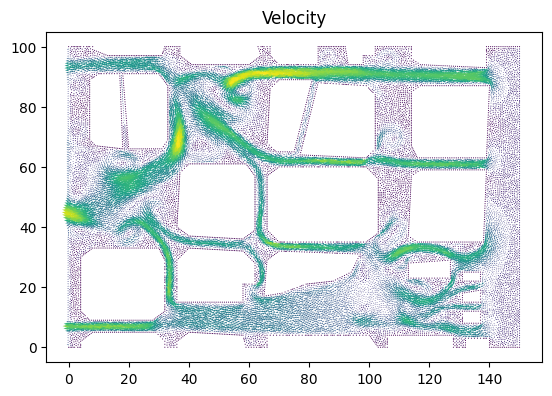

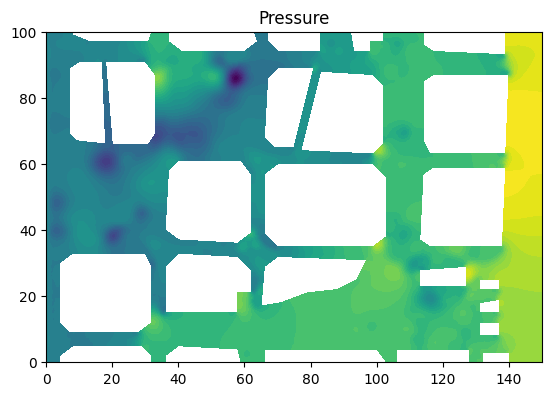

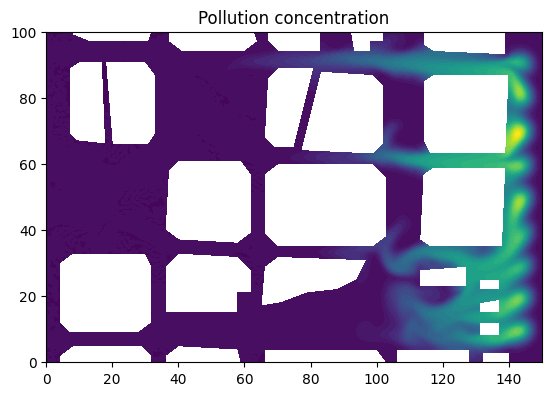

Time t = 18.538698256973277


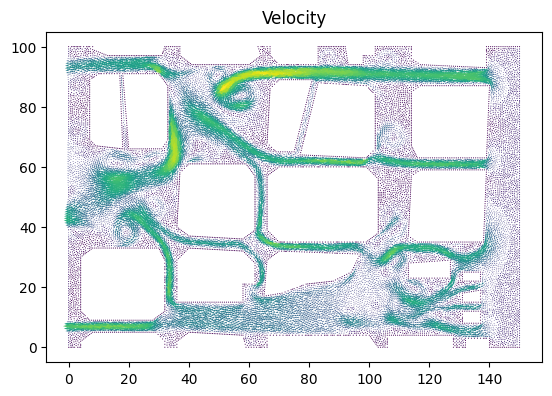

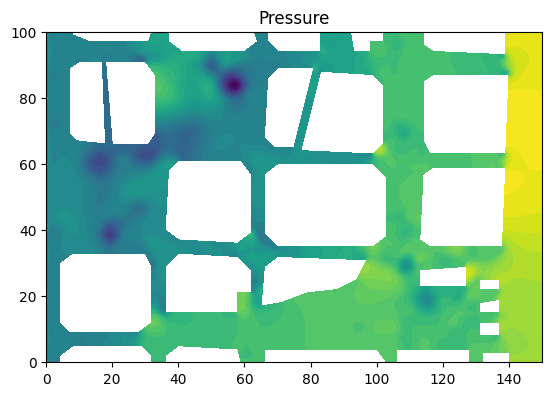

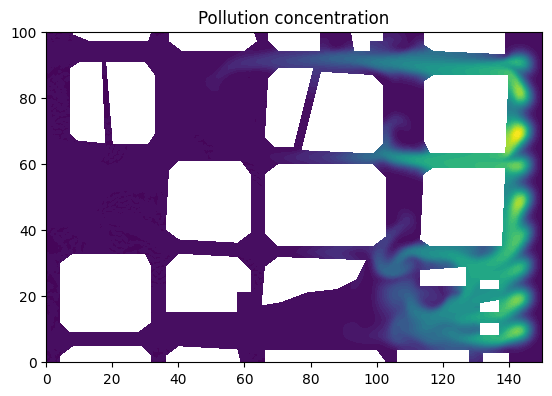

Time t = 20.174465750235633


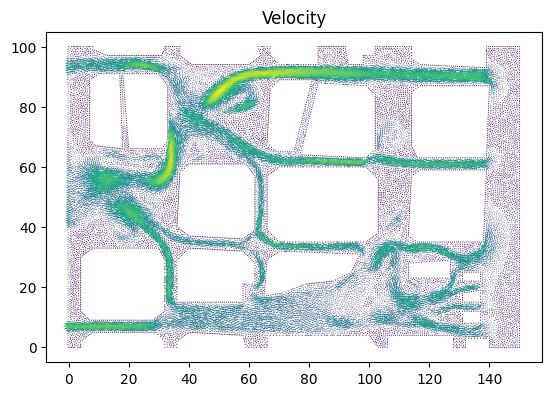

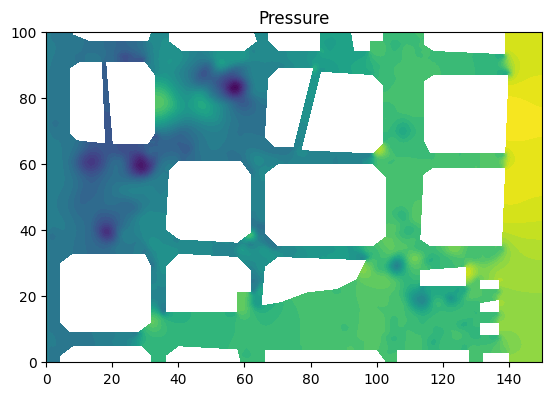

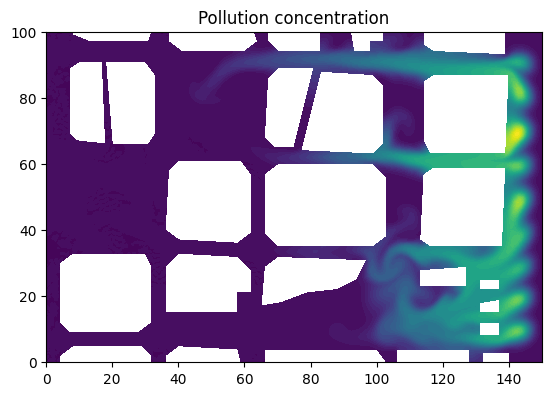

Time t = 21.81023324349799


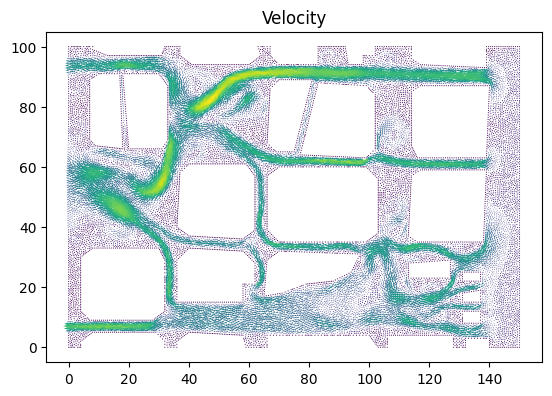

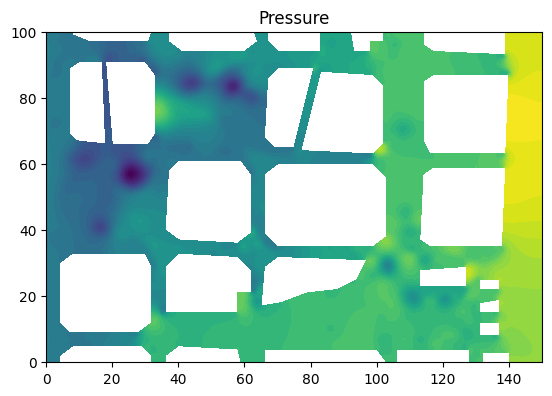

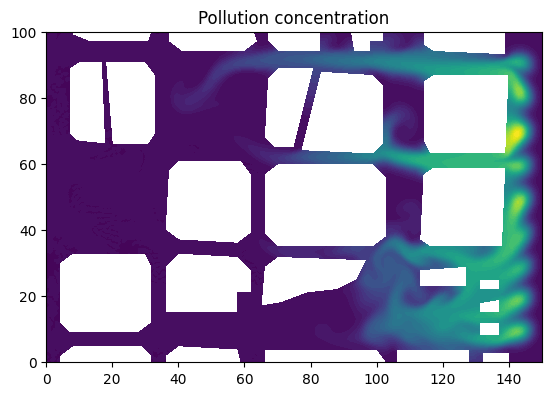

Time t = 23.446000736760347


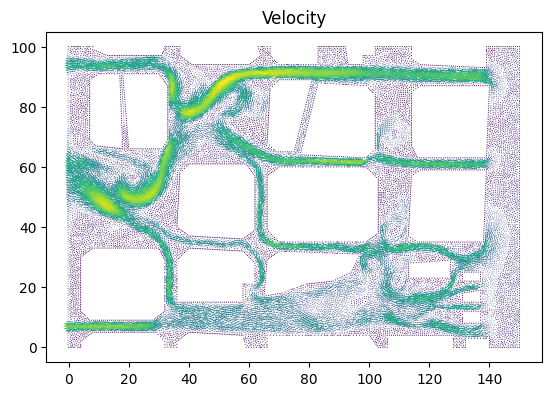

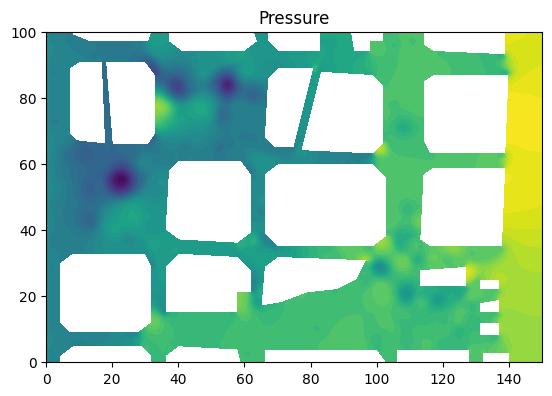

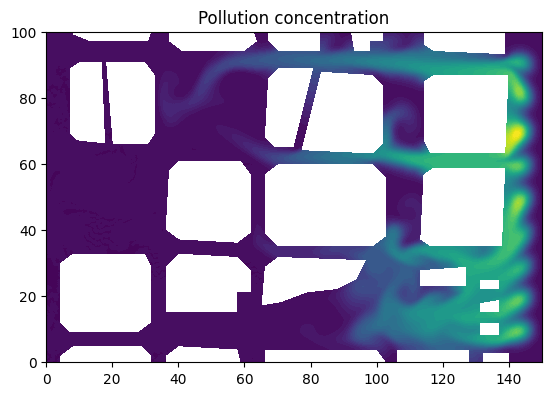

Time t = 25.081768230022703


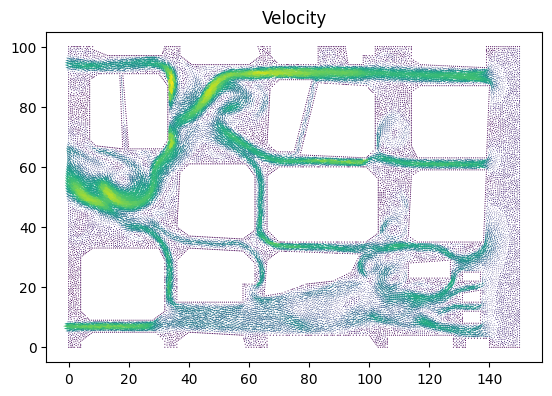

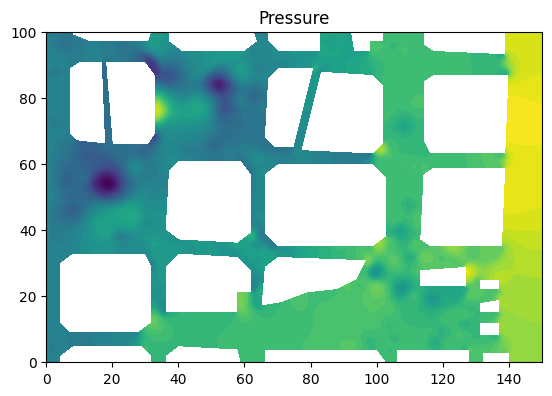

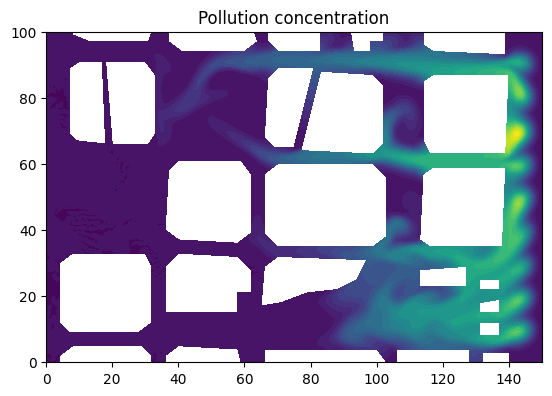

Time t = 26.71753572328506


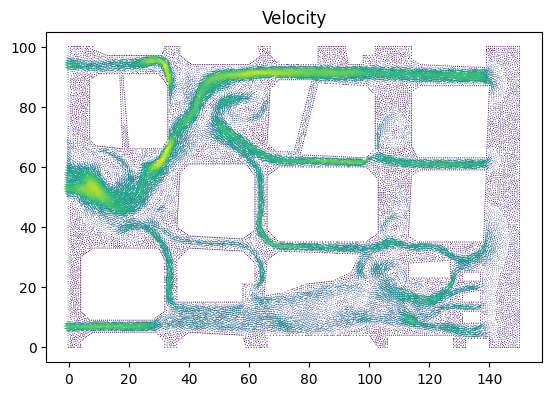

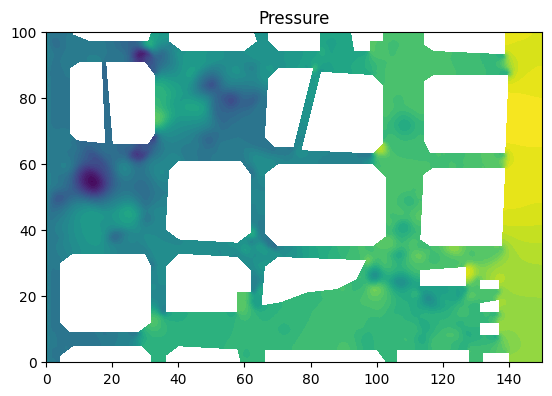

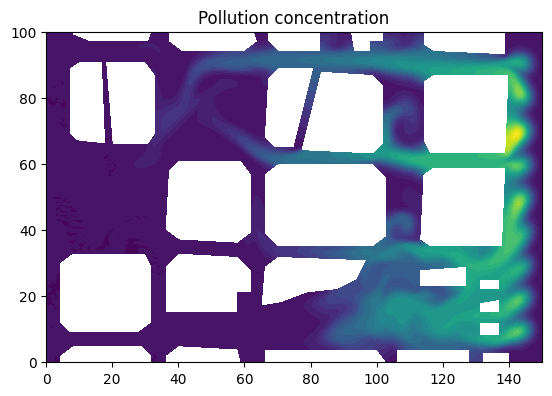

Time t = 28.353303216547417


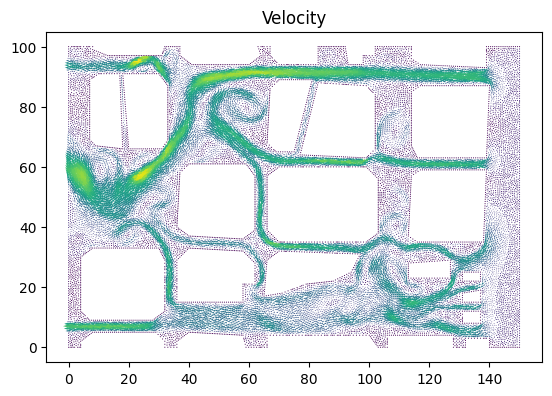

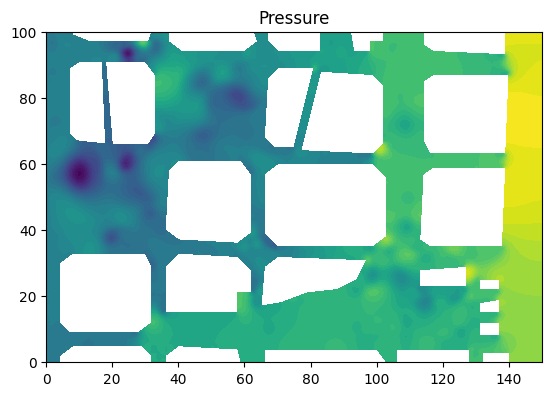

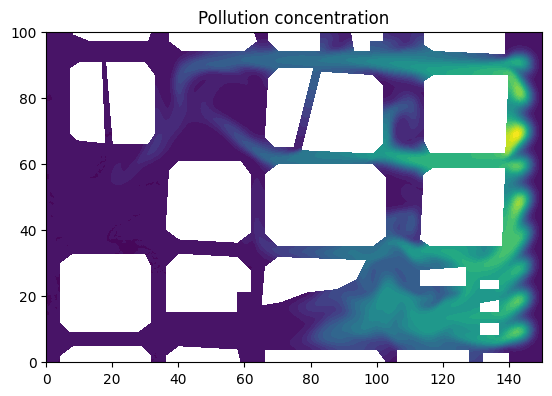

Time t = 30.2616986253535


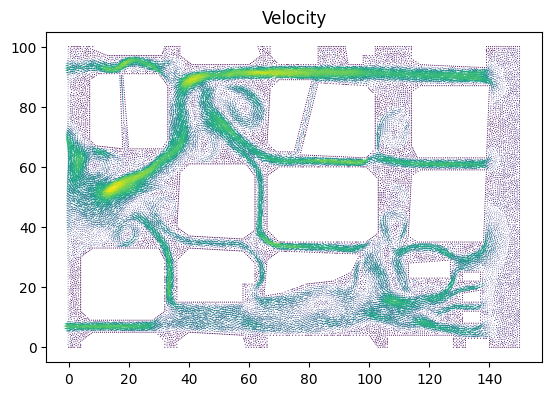

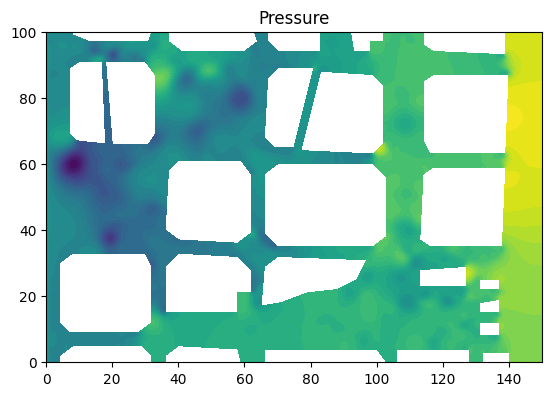

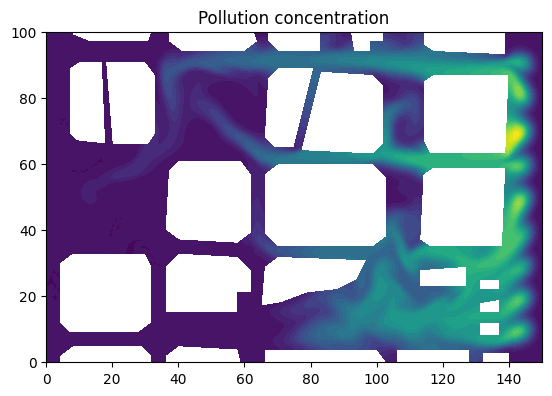

Time t = 31.897466118615856


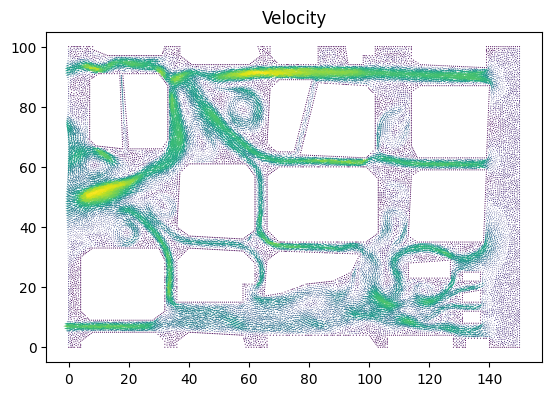

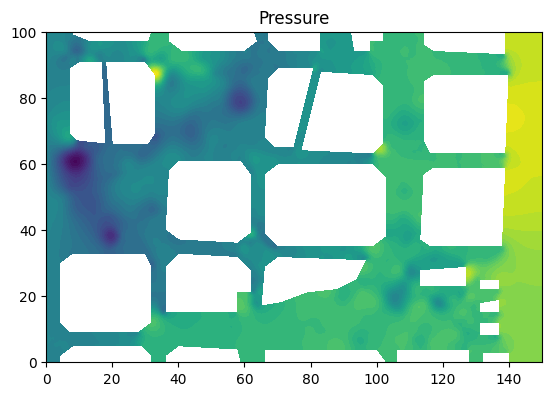

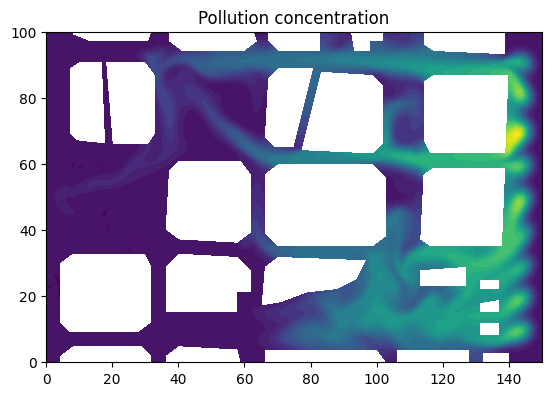

Time t = 33.533233611878195


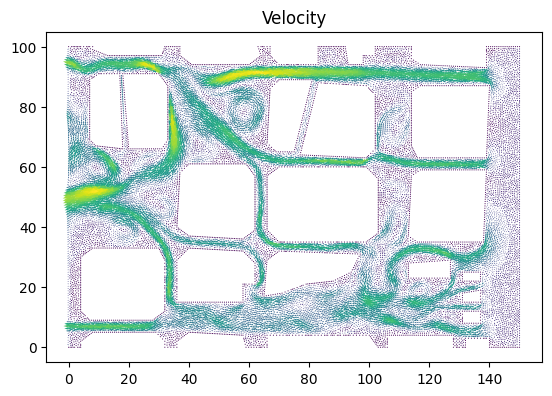

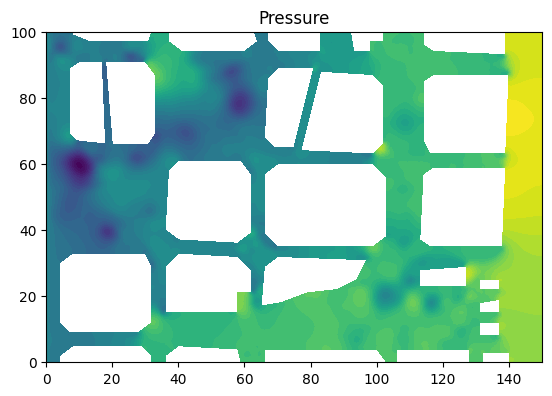

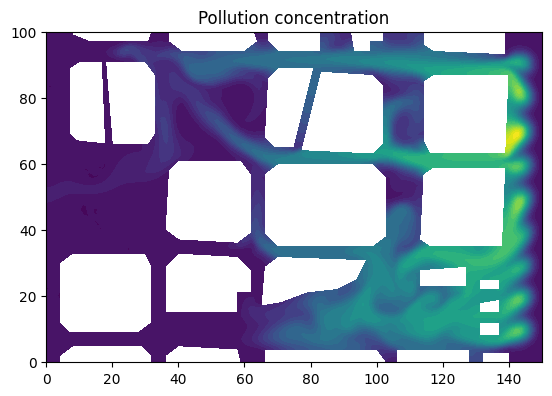

Time t = 35.16900110514053


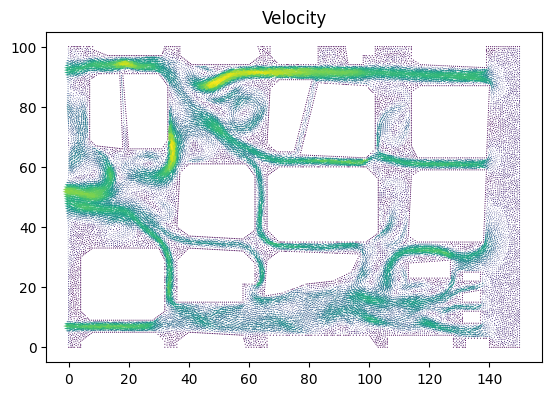

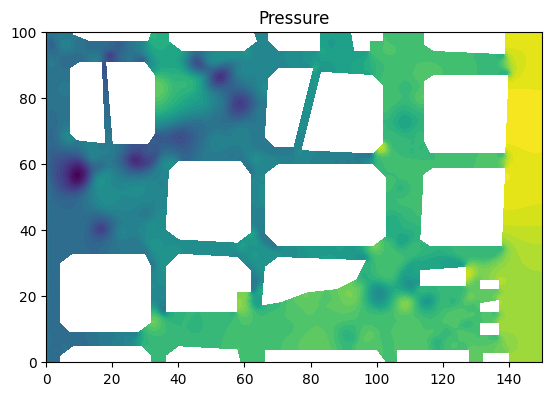

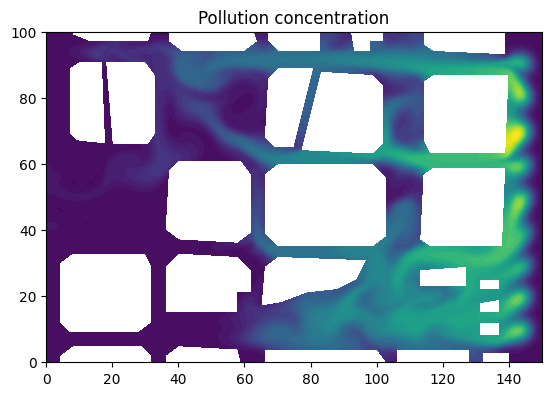

Time t = 36.804768598402866


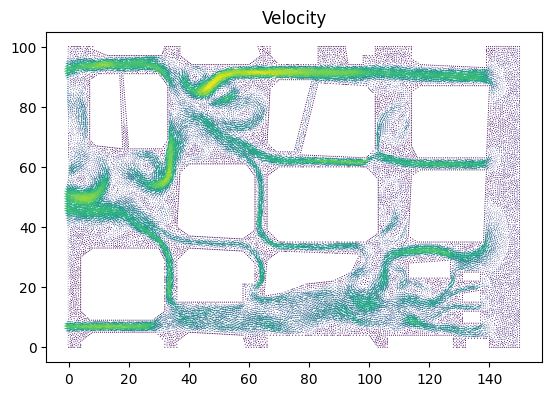

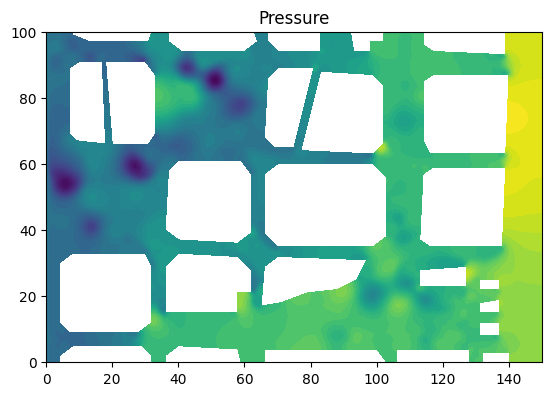

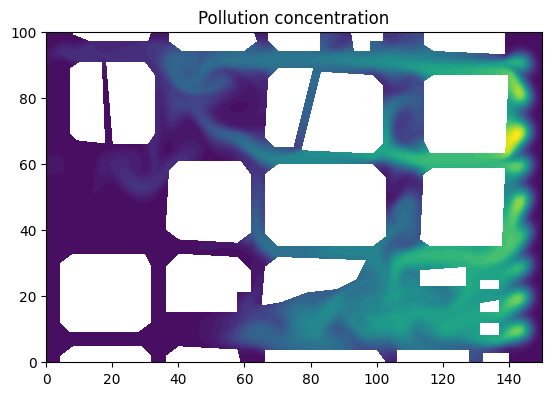

Time t = 38.4405360916652


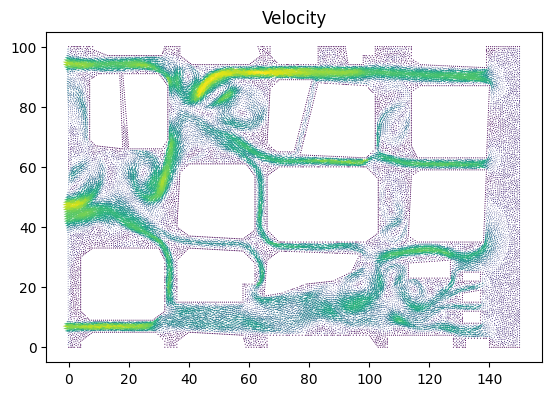

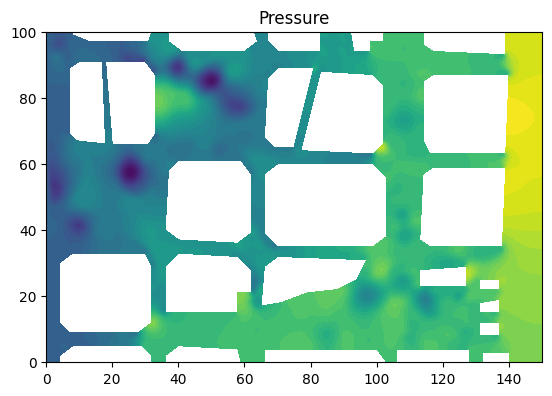

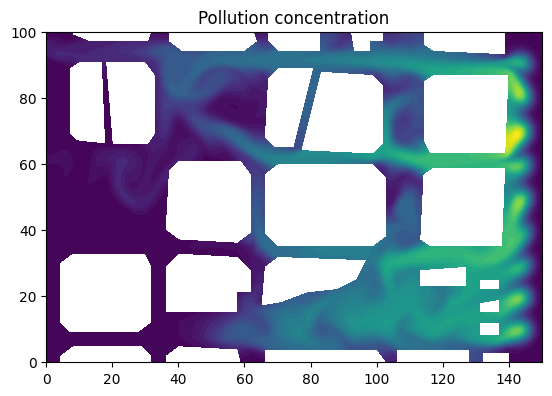

Time t = 40.07630358492754


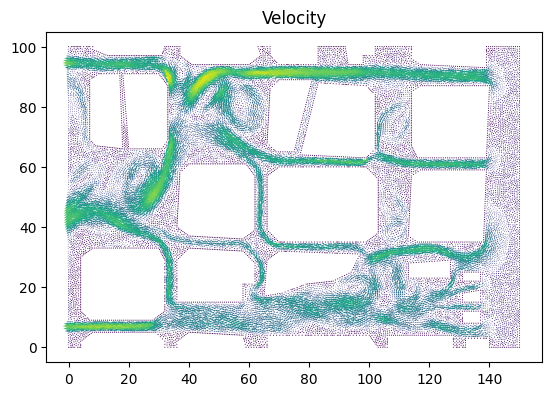

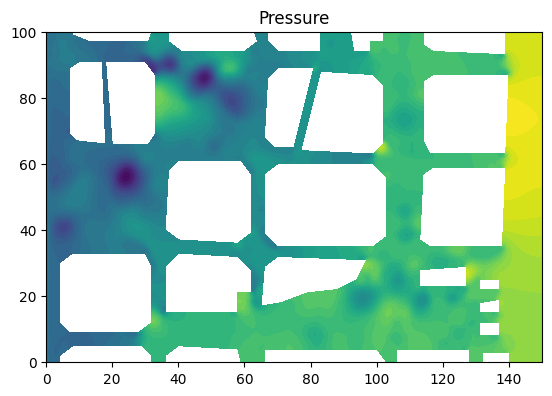

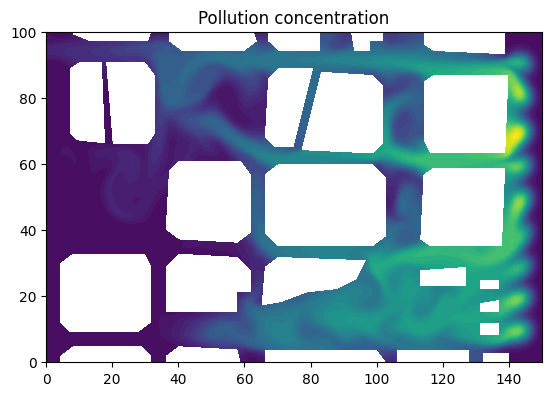

Time t = 41.71207107818987


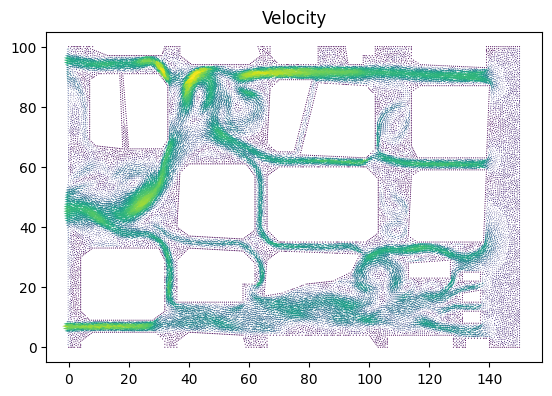

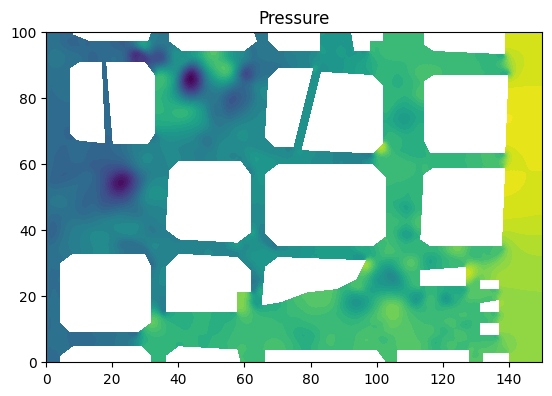

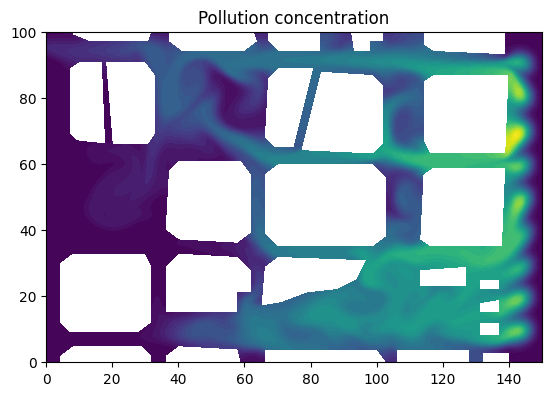

Time t = 43.34783857145221


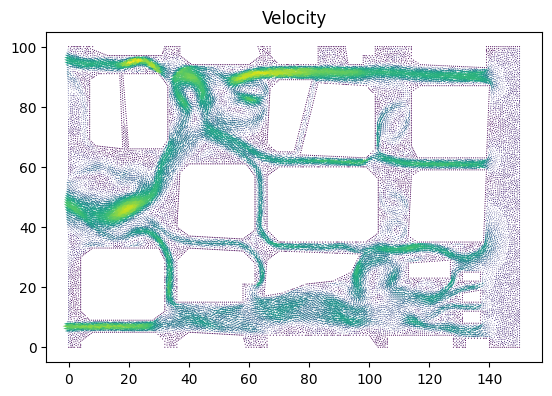

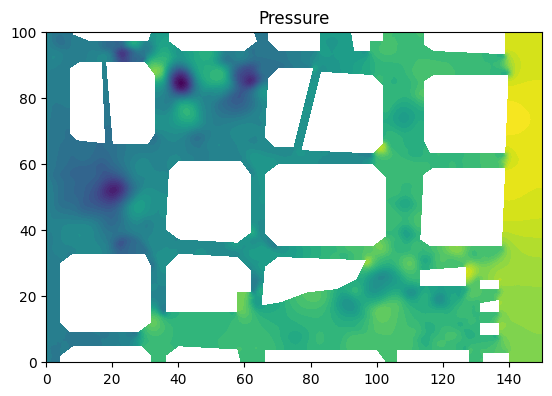

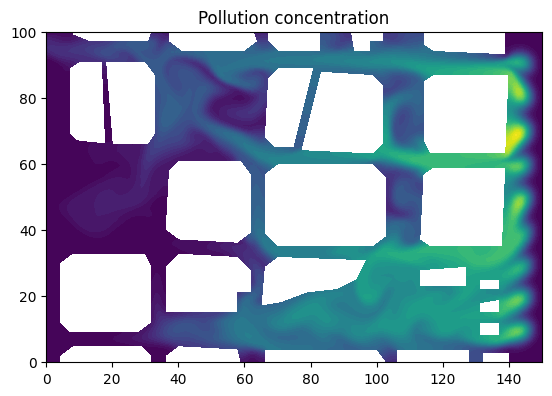

Time t = 45.256233980258266


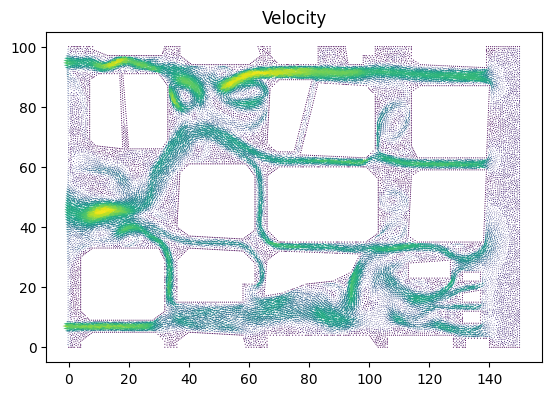

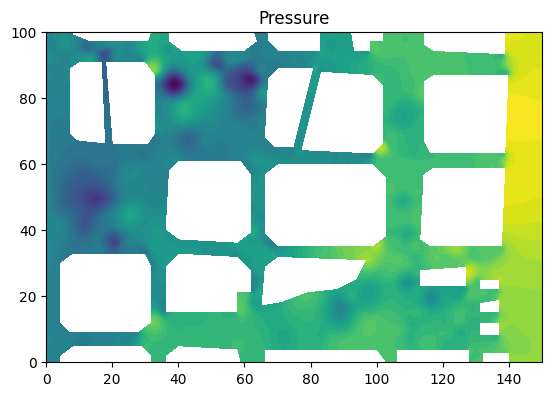

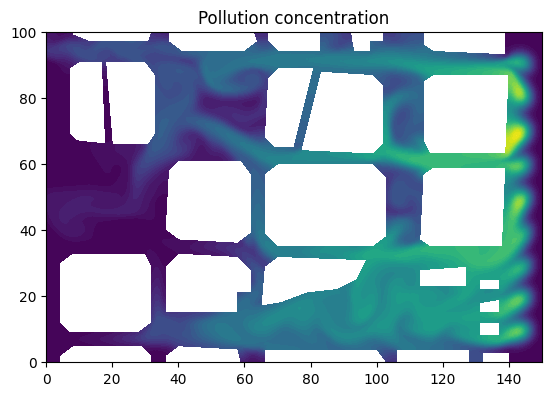

Time t = 46.8920014735206


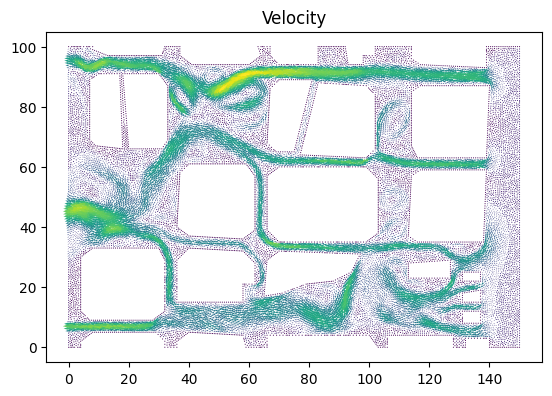

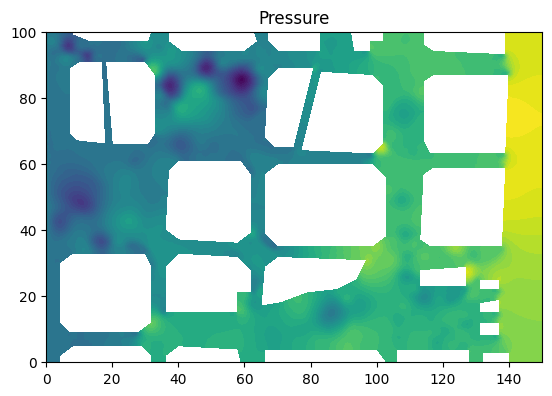

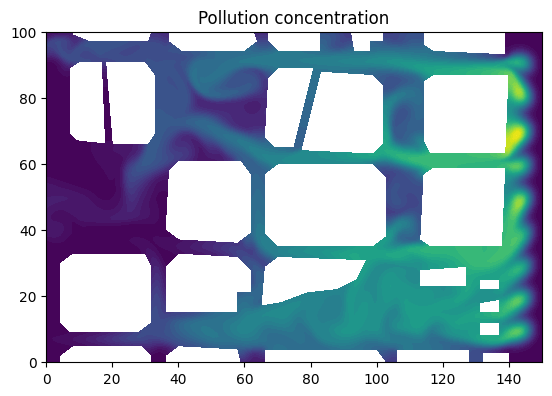

Time t = 48.527768966782936


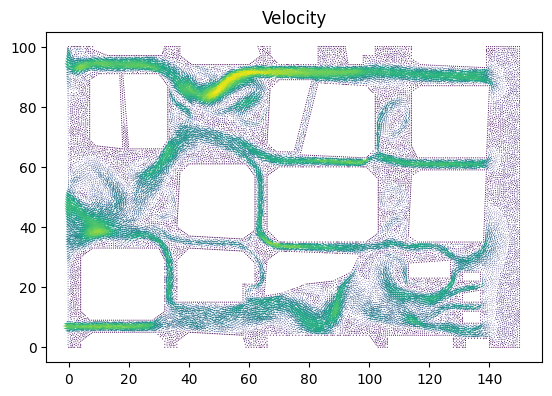

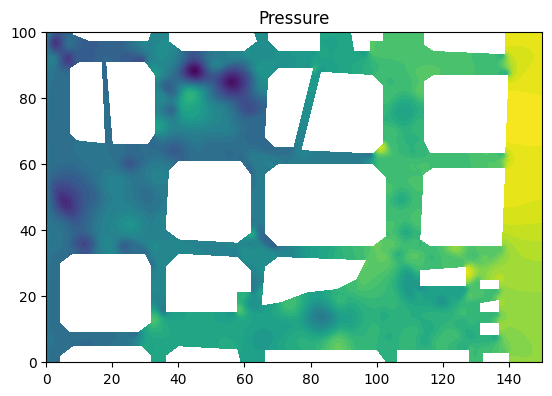

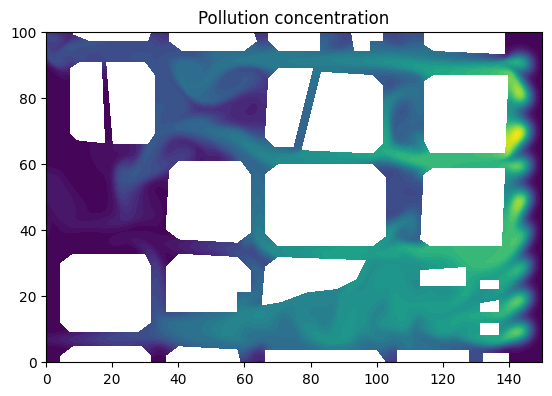

  adding: results-NS/png_frames/ (stored 0%)
  adding: results-NS/png_frames/velocity_0023.png (deflated 0%)
  adding: results-NS/png_frames/pollution_0005.png (deflated 5%)
  adding: results-NS/png_frames/velocity_0012.png (deflated 0%)
  adding: results-NS/png_frames/pollution_0025.png (deflated 4%)
  adding: results-NS/png_frames/velocity_0025.png (deflated 0%)
  adding: results-NS/png_frames/velocity_0016.png (deflated 0%)
  adding: results-NS/png_frames/pollution_0023.png (deflated 5%)
  adding: results-NS/png_frames/pollution_0009.png (deflated 5%)
  adding: results-NS/png_frames/pollution_0012.png (deflated 5%)
  adding: results-NS/png_frames/pollution_0013.png (deflated 5%)
  adding: results-NS/png_frames/velocity_0029.png (deflated 0%)
  adding: results-NS/png_frames/pollution_0008.png (deflated 5%)
  adding: results-NS/png_frames/velocity_0008.png (deflated 0%)
  adding: results-NS/png_frames/pollution_0028.png (deflated 4%)
  adding: results-NS/png_frames/velocity_0027.png (

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!rm results-NS/*

import os

# Folder for saved PNG frames
png_folder = "results-NS/png_frames"
os.makedirs(png_folder, exist_ok=True)

frame = 0

# Time stepping

# Function space for velocity magnitude
Vmag = FunctionSpace(mesh, "CG", 1)

T = 50
t = dt
while t < T + DOLFIN_EPS:

    #s = 'Time t = ' + repr(t)
    #print(s)

    pin.t = t
    #uin.t = t

    # Solve non-linear problem
    k = 0
    while k < num_nnlin_iter:

        # Assemble momentum matrix and vector
        Au = assemble(au)
        bu = assemble(Lu)

        # Compute velocity solution
        [bc.apply(Au, bu) for bc in bcu]
        [bc.apply(u1.vector()) for bc in bcu]
        solve(Au, u1.vector(), bu, "bicgstab", "default")

        # Assemble continuity matrix and vector
        Ap = assemble(ap)
        bp = assemble(Lp)

        # Compute pressure solution
        [bc.apply(Ap, bp) for bc in bcp]
        [bc.apply(p1.vector()) for bc in bcp]
        solve(Ap, p1.vector(), bp, "bicgstab", prec)

        # Compute force
        #F = assemble(Force)
        #if (t > start_sample_time):
         # force_array = np.append(force_array, normalization*F)
          #time = np.append(time, t)

        k += 1

        # Solve pollution transport equation using the current velocity u1
        Ac = assemble(ac)
        bc_vec = assemble(Lc)

        [bc.apply(Ac, bc_vec) for bc in bc_c]
        solve(Ac, c1.vector(), bc_vec, "bicgstab", "default")

    if t > plot_time:

        s = 'Time t = ' + repr(t)
        print(s)

        # Save solution to file
        file_u << u1
        file_p << p1
        file_c << c1

        # Plot solution

        # Velocity magnitude
        u_mag = project(sqrt(dot(u1, u1)), Vmag)
        max_velocity = u_mag.vector().get_local().max()

        frame += 1

        # Plot solution
        plt.figure()
        plot(u1, title="Velocity")

        filename = os.path.join(png_folder, f"velocity_{frame:04d}.png")
        plt.savefig(filename, dpi=300, bbox_inches="tight")

        plt.figure()
        plot(p1, title="Pressure")

        plt.figure()
        plot(c1, title="Pollution concentration")

        filename = os.path.join(png_folder, f"pollution_{frame:04d}.png")
        plt.savefig(filename, dpi=300, bbox_inches="tight")

        plot_time += T/plot_freq

        plt.show()



    # Update time step
    u0.assign(u1)
    c0.assign(c1)
    t += dt

!zip -r results-NS/png_frames.zip results-NS/png_frames
from google.colab import files
files.download("results-NS/png_frames.zip")

# **Discussion**

A stabilized finite element method was implemented in FEniCS to solve the Navier-Stokes equations in 2D. The method was tested for the model problem of flow past a circular obstacle, and for a high enough Reynolds number and sufficient mesh resolution [a von Karman vortex street developed as expected.](https://en.wikipedia.org/wiki/Kármán_vortex_street)